In [1]:
import os

import geopandas as gpd
import pandas as pd
import numpy as np
import shapely
import matplotlib as mpl
import matplotlib.pyplot as plt
import geopy
import urllib
from shapely.geometry import shape
import contextily as ctx


with_plotly = False # Preferably to True, but in case plotly cannot be installer, this allows the notebook to work
if with_plotly:
    import plotly.express as px
    import plotly.graph_objects as go

In [2]:
crs =     'epsg:3857'
osm_crs=  'epsg:4326'

# Functions

In [3]:
def download_if_nexist(url, filename):
    """
    If the (local) file <filename> does not exists, download it from <url> 

    Parameters
    ----------
    url: str
       url to fecth
    filename: str
       local file to save

    Returns
    -------

    None
    """
    if not os.path.isfile(filename):
        with urllib.request.urlopen(url) as response:
            with open(filename, "wb") as f:
                f.write(response.read())

In [4]:
def get_osm_polyg(name):
    """
    Request Nominatim (OpenStreetMap) for "name", and returns the polygon (or point) given in the (first) result
    
    Parameters
    ----------
    name: str
        
    """
    url = f"http://nominatim.openstreetmap.org/search.php?q={name}&format=json&limit=1&polygon_geojson=1"
    with urllib.request.urlopen(url) as response:
        json_res = json.loads(response.read())
        if len(json_res)==0:
            return None
        return shape(json_res[0]["geojson"])


# Load data

## Zip code list

Get the official list of Belgian zipcodes, provided by BPost. Some of them correspond to real (sub)-localities, other are "special codes", corresponding to some institutions (Parliaments, ...) or companies (RTBF, 3 Suisses, ...)

This source does not contain any geographical informations

If several entities share the same zipcode, this zipcode appears in several records

In [5]:
download_if_nexist("https://www.bpost2.be/zipcodes/files/zipcodes_alpha_fr_new.xls",
                  "data/zipcodes_alpha_fr_new.xls")

zipcodes = pd.read_excel("data/zipcodes_alpha_fr_new.xls")
zipcodes = zipcodes.rename({"Code postal":"zipcode", "Commune principale": "main_commune", "Localité":"locality"}, axis=1)
zipcodes["zipcode"] = zipcodes["zipcode"].astype(str)
zipcodes["is_special"] = zipcodes["Sous-commune"].isnull()
print(zipcodes.zipcode.nunique(), "unique zipcodes")
zipcodes

1190 unique zipcodes


,zipcode,locality,Sous-commune,main_commune,Province,is_special
0,2970,'S Gravenwezel,Oui,SCHILDE,ANVERS,False
1,3700,'S Herenelderen,Oui,TONGEREN,LIMBOURG,False
2,7510,3 Suisses,NaN,3 Suisses,NaN,True
3,9420,Aaigem,Oui,ERPE-MERE,FLANDRE-ORIENTALE,False
4,8511,Aalbeke,Oui,KORTRIJK,FLANDRE-OCCIDENTALE,False
...,...,...,...,...,...,...
2760,3690,Zutendaal,Non,ZUTENDAAL,LIMBOURG,False
2761,8550,Zwevegem,Non,ZWEVEGEM,FLANDRE-OCCIDENTALE,False
2762,8750,Zwevezele,Oui,WINGENE,FLANDRE-OCCIDENTALE,False
2763,9052,Zwijnaarde,Oui,GENT,FLANDRE-ORIENTALE,False


In [6]:
zipcodes_normal = zipcodes[~zipcodes.is_special].drop("is_special", axis=1)

### Some stats

In [7]:
print("Number of zipcodes:", zipcodes.zipcode.nunique())
print("Number of (not special) zipcodes :", zipcodes_normal.zipcode.nunique())
print("Number of (main) communes:", (zipcodes_normal.main_commune+"_"+zipcodes_normal.Province).nunique())

Number of zipcodes: 1190
Number of (not special) zipcodes : 1146
Number of (main) communes: 581


In [8]:
commune_stats =zipcodes_normal.groupby("main_commune").agg({"zipcode":"nunique", 
                                                            "locality":"count", 
                                                            "Province": max})
commune_stats

,zipcode,locality,Province
main_commune,,,
AALST,4,9,FLANDRE-ORIENTALE
AALTER,3,6,FLANDRE-ORIENTALE
AARSCHOT,3,4,BRABANT FLAMAND
AARTSELAAR,1,1,ANVERS
AFFLIGEM,1,4,BRABANT FLAMAND
...,...,...,...
ZULTE,1,3,FLANDRE-ORIENTALE
ZUTENDAAL,1,1,LIMBOURG
ZWALM,2,12,FLANDRE-ORIENTALE


In [9]:
division_counts = pd.DataFrame(columns = ["#zipcodes", "#localities", "desc", "query"],
             data=[
 ["=1", "=1",   "Only one locality within the commune",         "(zipcode==1) & (locality == 1)"],
 ["=1", ">1",   "Zipcode share by all the localities",          "(zipcode==1) & (locality>1)"],
 [">1", "=zip", "A distinct zipcode for each locality",         "(zipcode >1) & (zipcode==locality)"],
 [">1", ">zip", "Some localities share zipcodes",               "(zipcode >1) & (zipcode<locality)"],
# [">1", "<zip", "(more zip than localities, does not happen)",  "(zipcode >1) & (zipcode>locality)"] 
])

In [10]:
division_counts["BEL"] = division_counts["query"].apply(lambda q: commune_stats.query(q).locality.count())
division_counts.drop("query", axis=1)

,#zipcodes,#localities,desc,BEL
0,=1,=1,Only one locality within the commune,98
1,=1,>1,Zipcode share by all the localities,261
2,>1,=zip,A distinct zipcode for each locality,53
3,>1,>zip,Some localities share zipcodes,169


In [11]:
# Stats per province
prov_counts = division_counts["query"].apply(lambda q: commune_stats.query(q).groupby("Province").locality.count()).fillna(0)
division_counts_prov = pd.concat([division_counts.drop("query", axis=1), prov_counts], axis=1)
division_counts_prov

,#zipcodes,#localities,desc,BEL,ANVERS,BRABANT FLAMAND,BRABANT WALLON,BRUXELLES,FLANDRE-OCCIDENTALE,FLANDRE-ORIENTALE,HAINAUT,LIEGE,LIMBOURG,LUXEMBOURG,NAMUR
0,=1,=1,Only one locality within the commune,98,33.0,11.0,3.0,18.0,11.0,7.0,2.0,4.0,8.0,1.0,0.0
1,=1,>1,Zipcode share by all the localities,261,24.0,21.0,17.0,0.0,37.0,30.0,27.0,42.0,18.0,22.0,23.0
2,>1,=zip,A distinct zipcode for each locality,53,6.0,11.0,3.0,1.0,4.0,5.0,5.0,11.0,5.0,2.0,0.0
3,>1,>zip,Some localities share zipcodes,169,6.0,22.0,4.0,0.0,12.0,18.0,35.0,27.0,11.0,19.0,15.0


<AxesSubplot:>

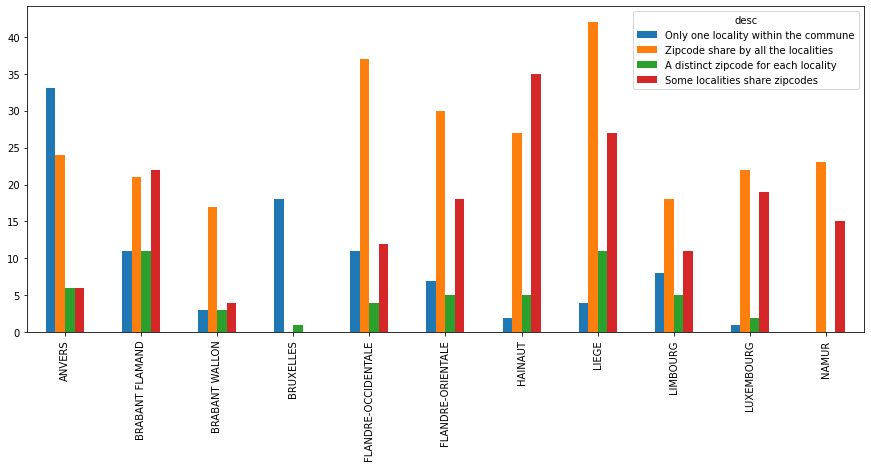

In [12]:
division_counts_prov.set_index("desc").drop(["BEL", "#zipcodes", "#localities"], axis=1).T.plot.bar(figsize=(15,6))

In [13]:
print("Communes with a locality having the same name")
display(zipcodes_normal[(zipcodes_normal.locality.str.upper() == zipcodes_normal.main_commune)])
print("Number of (unique) communes:", zipcodes_normal[(zipcodes_normal.locality.str.upper() == zipcodes_normal.main_commune)].main_commune.nunique())

Communes with a locality having the same name


,zipcode,locality,Sous-commune,main_commune,Province
6,9300,Aalst,Non,AALST,FLANDRE-ORIENTALE
7,9880,Aalter,Non,AALTER,FLANDRE-ORIENTALE
8,3200,Aarschot,Non,AARSCHOT,BRABANT FLAMAND
11,2630,Aartselaar,Non,AARTSELAAR,ANVERS
22,1790,Affligem,Non,AFFLIGEM,BRABANT FLAMAND
...,...,...,...,...,...
2757,8377,Zuienkerke,Non,ZUIENKERKE,FLANDRE-OCCIDENTALE
2758,9870,Zulte,Non,ZULTE,FLANDRE-ORIENTALE
2760,3690,Zutendaal,Non,ZUTENDAAL,LIMBOURG
2761,8550,Zwevegem,Non,ZWEVEGEM,FLANDRE-OCCIDENTALE


Number of (unique) communes: 521


In [14]:
zipcodes_normal[zipcodes_normal["Sous-commune"] == "Non"]

,zipcode,locality,Sous-commune,main_commune,Province
6,9300,Aalst,Non,AALST,FLANDRE-ORIENTALE
7,9880,Aalter,Non,AALTER,FLANDRE-ORIENTALE
8,3200,Aarschot,Non,AARSCHOT,BRABANT FLAMAND
11,2630,Aartselaar,Non,AARTSELAAR,ANVERS
22,1790,Affligem,Non,AFFLIGEM,BRABANT FLAMAND
...,...,...,...,...,...
2757,8377,Zuienkerke,Non,ZUIENKERKE,FLANDRE-OCCIDENTALE
2758,9870,Zulte,Non,ZULTE,FLANDRE-ORIENTALE
2760,3690,Zutendaal,Non,ZUTENDAAL,LIMBOURG
2761,8550,Zwevegem,Non,ZWEVEGEM,FLANDRE-OCCIDENTALE


In [15]:
# Several localities with the same name within the same commune
zipcodes[zipcodes[["locality", "main_commune"]].duplicated(keep=False)].sort_values("locality")

,zipcode,locality,Sous-commune,main_commune,Province,is_special
60,2000,Antwerpen,Non,ANTWERPEN,ANVERS,False
61,2018,Antwerpen,Non,ANTWERPEN,ANVERS,False
62,2020,Antwerpen,Non,ANTWERPEN,ANVERS,False
63,2030,Antwerpen,Non,ANTWERPEN,ANVERS,False
64,2040,Antwerpen,Non,ANTWERPEN,ANVERS,False
65,2050,Antwerpen,Non,ANTWERPEN,ANVERS,False
66,2060,Antwerpen,Non,ANTWERPEN,ANVERS,False
1181,9120,Kallo,Oui,BEVEREN-WAAS,FLANDRE-ORIENTALE,False
1182,9130,Kallo,Oui,BEVEREN-WAAS,FLANDRE-ORIENTALE,False
1359,4000,Liège,Non,LIÈGE,LIEGE,False


## Zip code centers

Get a list giving for each zipcode, its locality name, and geographical center.


Note : it does not contain any "special zicode"

In [16]:
# https://data.gov.be/fr/dataset/328ba4f140ba0e870dfc9c70635fe7c1840980b1
download_if_nexist("https://www.odwb.be/api/v2/catalog/datasets/code-postaux-belge/exports/geojson",
                  "data/zipcode_centers.geojson")

zipcodes_centers = gpd.read_file("data/zipcode_centers.geojson")
zipcodes_centers = zipcodes_centers.rename({"column_1": "zipcode", "column_2": "locality"}, axis=1)[["locality","zipcode", "geometry"]]

zipcodes_centers = zipcodes_centers.to_crs(crs)
print(zipcodes_centers.zipcode.nunique(), "unique zipcode")
zipcodes_centers

1145 unique zipcode


,locality,zipcode,geometry
0,Ixelles,1050,POINT (487754.219 6589918.068)
1,Koekelberg,1081,POINT (481535.656 6596965.764)
2,Haren,1130,POINT (491205.143 6602205.979)
3,Woluwe-Saint-Pierre,1150,POINT (494625.526 6591144.170)
4,Incourt,1315,POINT (534216.002 6566956.791)
...,...,...,...
2752,Ertvelde,9940,POINT (417134.047 6653080.277)
2753,Boekhoute,9961,POINT (412545.747 6665801.135)
2754,Sint-Jan-In-Eremo,9982,POINT (398534.241 6668876.259)
2755,Waterland-Oudeman,9988,POINT (399698.031 6672595.592)


In [17]:
# Missing zipcode
zipcodes_normal[~zipcodes_normal.zipcode.isin(zipcodes_centers.zipcode)]

,zipcode,locality,Sous-commune,main_commune,Province
1895,5352,Perwez-Haillot,Oui,OHEY,NAMUR


## Zip code boundaries

Get the boundaries for all zipcodes. Provided by BPost.

In the original files, multi-polygons as given as multiple (single)-polygons records. We merge them in ony one record.

Note that in the "center" file, if several entities share the same zip, the center of each entity is given, while here, we only have one (multi-)polygon per zipcode.

In [18]:
zipcode_boundaries_filename = "data/zipcode_boundaries_shapefile_3812.zip"

In [19]:
# https://www.geo.be/catalog/details/9738c7c0-5255-11ea-8895-34e12d0f0423?l=fr
download_if_nexist("https://bgu.bpost.be/assets/9738c7c0-5255-11ea-8895-34e12d0f0423_x-shapefile_3812.zip",
                  zipcode_boundaries_filename)

In [20]:
zipcodes_boundaries = gpd.read_file(f"zip://{zipcode_boundaries_filename}/3812")
zipcodes_boundaries["is_special"] = zipcodes_boundaries.CP_speciau ==1
zipcodes_boundaries = zipcodes_boundaries.rename({"nouveau_PO":"zipcode"}, axis=1)[["zipcode", "is_special", "geometry"]]

zipcodes_boundaries = zipcodes_boundaries.dissolve(["zipcode", "is_special"]).reset_index()

zipcodes_boundaries = zipcodes_boundaries.to_crs(crs)
zipcodes_boundaries

,zipcode,is_special,geometry
0,1000,False,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...
1,1005,True,"POLYGON Z ((484391.808 6593846.983 0.000, 4844..."
2,1006,True,"POLYGON Z ((484413.037 6593943.815 0.000, 4843..."
3,1007,True,"POLYGON Z ((486232.320 6594255.851 0.000, 4862..."
4,1008,True,"POLYGON Z ((486000.332 6594258.665 0.000, 4858..."
...,...,...,...
1182,9982,False,"POLYGON Z ((398126.149 6670079.581 0.000, 3981..."
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021..."
1184,9990,False,"POLYGON Z ((383123.261 6664423.574 0.000, 3831..."
1185,9991,False,"POLYGON Z ((389466.378 6660430.021 0.000, 3895..."


In [21]:
# Missing zipcode
zipcodes_normal[~zipcodes_normal.zipcode.isin(zipcodes_boundaries.zipcode)]

,zipcode,locality,Sous-commune,main_commune,Province
1175,6642,Juseret,Oui,VAUX-SUR-SÛRE,LUXEMBOURG


In [22]:
# Extra zipcode
zipcodes_boundaries[~zipcodes_boundaries.zipcode.isin(zipcodes.zipcode)]

,zipcode,is_special,geometry
1071,9,False,"POLYGON Z ((551743.087 6617609.407 0.000, 5517..."


## NIS code boundaries

Get boundaries for all statistical sectors, from StatBel. Statistical sectors can be grouped by NIS code, providing NIS code boundaries.

In [23]:
# https://statbel.fgov.be/fr/open-data/secteurs-statistiques-2020

download_if_nexist("https://statbel.fgov.be/sites/default/files/files/opendata/Statistische%20sectoren/sh_statbel_statistical_sectors_31370_20200101.shp.zip",
                   "data/stat_sectors_2020.zip")
statistical_sectors = gpd.read_file("zip://data/stat_sectors_2020.zip/sh_statbel_statistical_sectors_20200101.shp")
statistical_sectors["CNIS5_2020"] = statistical_sectors["CNIS5_2020"].astype(str)

In [24]:
# Group (with "dissolve") sectors per NIS code
nis_boundaries = statistical_sectors[["CNIS5_2020", "T_MUN_FR", "T_MUN_NL", "geometry"]].dissolve(by="CNIS5_2020").reset_index()
nis_boundaries = nis_boundaries.rename({"CNIS5_2020": "niscode"}, axis=1)
nis_boundaries = nis_boundaries.to_crs(crs)

# Spatial join : polygon vs point

As a first example of spatial join, we will join polygons (from zipcodes_boundaries) and points (from zipcodes_centers).

In the resulting table sjoin_zip_center, we'll get all combination of zipcodes_boundaries and zipcodes_centers, where the point of zipcodes_centers falls into the polygon of zipcodes_boundaries.

sjoin_mismatches will contain all combinations where the zipcode provided by zipcodes_centers does not match the zipcode provided by zipcodes_boundaries

In [25]:
sjoin_zip_center = gpd.sjoin(zipcodes_boundaries, zipcodes_centers)
sjoin_zip_center

,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
0,1000,False,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...,1678,Bruxelles,1000
8,1020,False,"POLYGON Z ((484519.836 6603848.988 0.000, 4845...",1139,Laeken,1020
9,1030,False,"POLYGON Z ((488633.964 6600056.547 0.000, 4887...",1140,Schaerbeek,1030
13,1040,False,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,2214,Etterbeek,1040
21,1050,False,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,0,Ixelles,1050
...,...,...,...,...,...,...
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021...",547,Watervliet,9988
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021...",2755,Waterland-Oudeman,9988
1184,9990,False,"POLYGON Z ((383123.261 6664423.574 0.000, 3831...",2756,Maldegem,9990
1185,9991,False,"POLYGON Z ((389466.378 6660430.021 0.000, 3895...",2212,Adegem,9991


In [26]:
sjoin_mismatches = sjoin_zip_center[sjoin_zip_center.zipcode_left != sjoin_zip_center.zipcode_right].reset_index(drop=True)
sjoin_mismatches

,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
0,1130,False,"POLYGON Z ((492165.130 6604187.117 0.000, 4921...",1264,Haren,3700
1,1541,False,"POLYGON Z ((442698.747 6572867.831 0.000, 4427...",1047,Driekapellen,8600
2,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",1198,Antwerpen,2040
3,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2256,Antwerpen,2030
4,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2255,Antwerpen,2018
5,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",593,Antwerpen,2050
6,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",1736,Antwerpen,2020
7,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2259,Antwerpen,2060
8,2180,False,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",1245,Laar,3400
9,2180,False,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",2262,Schriek,2223


We can now explore all those mismatch. As a way to make decisions easier, we provide several data: 
- The mismatch record (with two different zipcodes zip1, zip2)
- Information we have from BPost for the two zipcodes
- What OpenStreetMap knows at the point given by zipcodes_centers
- What OpenStreetMap knows for the given locality (in zipcodes_centers)
- A map with : 
    - the boundaries corresponding to zip1 and zip2 in zipcodes_boundaries et 
    - all points corresponding to zip1 and zip2 in zipcodes_centers

In [27]:
def plot_mismatch_zip(sjoin_mismatches, i):
    print(f"Mismatch record {i}:")
    display(sjoin_mismatches.iloc[[i]])

    zip1 = sjoin_mismatches.iloc[i].zipcode_left
    zip2 = sjoin_mismatches.iloc[i].zipcode_right

    print("From BPost:")
    display( zipcodes[ zipcodes.zipcode.isin([zip1, zip2])])

    try: 
        print("Know by OSM at the given point:")
        pt = zipcodes_centers.to_crs(osm_crs).loc[sjoin_mismatches.iloc[i].index_right].geometry
        geolocator = geopy.geocoders.Nominatim(user_agent="smalsresearch")
        print(geolocator.reverse(f"{pt.y}, {pt.x}").address)

        print("Know by OSM for the given locality:")
        loc = zipcodes_centers.loc[sjoin_mismatches.iloc[i].index_right].locality
        print(geolocator.geocode(f"{loc}, Belgium").address)
    except Exception as e:
        print("Cannot get OSM data:", e)

    query = f"zipcode in ('{zip1}', '{zip2}')"


    df_bnd = zipcodes_boundaries.assign(label=zipcodes_boundaries.zipcode).query(query).to_crs(osm_crs)
    df_pnt = zipcodes_centers.assign(label=zipcodes_centers.zipcode+" "+zipcodes_centers.locality).query(query).to_crs(osm_crs)

    df_pnt["mismatch"] = False
    df_pnt.loc[sjoin_mismatches.iloc[i].index_right, "mismatch"] = True

    if with_plotly:
        fig = px.choropleth_mapbox(df_bnd, 
                                   geojson=df_bnd.geometry, 
                                   locations=df_bnd.index, 
                                   hover_name="label",
                                   color=df_bnd['label'],
                                   center={"lat": df_bnd.bounds.mean()[["miny", "maxy"]].mean(), 
                                           "lon": df_bnd.bounds.mean()[["minx", "maxx"]].mean()},
                                   mapbox_style="open-street-map",
                                   #zoom=10,
                                   opacity=0.5,

                           )

        for i, bloc in df_pnt.groupby("mismatch"): 
            fig.add_trace(go.Scattermapbox(lat=bloc.geometry.y,
                                           lon=bloc.geometry.x,
                                           mode='markers+text', # "markers+text",
                                           text=bloc.label, 
                                           name="Zipcode centers" + (" (mismatch)" if i else ""),
                                           textposition="bottom center"
                                          )
                                    )
        fig.show()
    else: 
        df=pd.concat([df_bnd, df_pnt]).to_crs(crs)
        df["label"] = df["label"] + np.where(df.mismatch==True, "*", "")
        ax = df.plot("label", figsize=(10,15), legend=True)
        try:
            ctx.add_basemap(ax)
        except Exception as  e:
            print("Cannot add basemap: ", e)
        plt.show()
        display(df[["zipcode", "geometry","label"]])

Mismatch record 8:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
8,2180,False,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",1245,Laar,3400


From BPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
603,2180,Ekeren,Oui,ANTWERPEN,ANVERS,False
609,3400,Eliksem,Oui,LANDEN,BRABANT FLAMAND,False
683,3400,Ezemaal,Oui,LANDEN,BRABANT FLAMAND,False
1266,3400,Laar,Oui,LANDEN,BRABANT FLAMAND,False
1285,3400,Landen,Non,LANDEN,BRABANT FLAMAND,False
1692,3400,Neerwinden,Oui,LANDEN,BRABANT FLAMAND,False
1867,3400,Overwinden,Oui,LANDEN,BRABANT FLAMAND,False
2079,3400,Rumsdorp,Oui,LANDEN,BRABANT FLAMAND,False
2581,3400,Wange,Oui,LANDEN,BRABANT FLAMAND,False


Know by OSM at the given point:
11, Laar, Donk, Ekeren, Antwerpen, Vlaanderen, 2180, België / Belgique / Belgien
Know by OSM for the given locality:
Laar, Wommelgem, Antwerpen, Vlaanderen, 2160, België / Belgique / Belgien


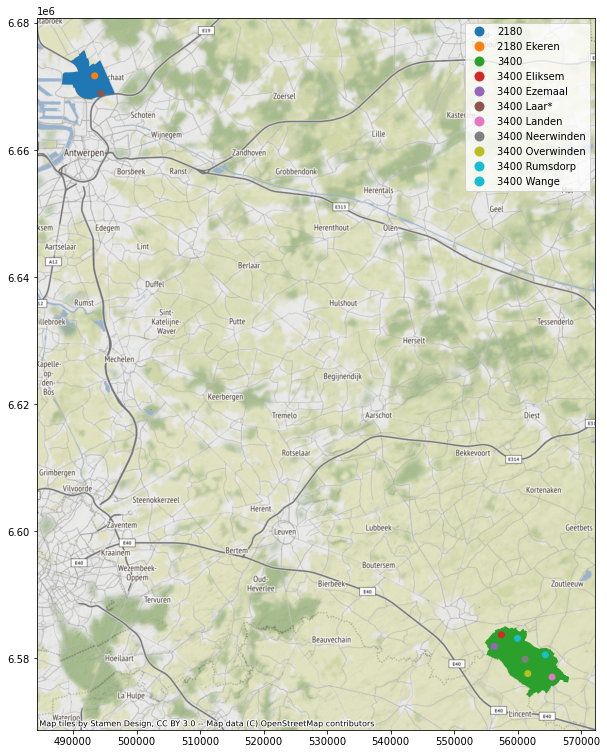

,zipcode,geometry,label
169,2180,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",2180
311,3400,"POLYGON Z ((558689.985 6584691.286 0.000, 5587...",3400
594,2180,POINT (493399.941 6671721.019),2180 Ekeren
647,3400,POINT (556300.652 6581875.841),3400 Ezemaal
648,3400,POINT (564340.440 6580563.701),3400 Rumsdorp
1244,3400,POINT (557431.485 6583720.469),3400 Eliksem
1245,3400,POINT (494374.378 6668971.891),3400 Laar*
1246,3400,POINT (561161.283 6579870.014),3400 Neerwinden
1247,3400,POINT (561584.848 6577616.941),3400 Overwinden
1789,3400,POINT (559967.361 6583146.119),3400 Wange


--------------
Mismatch record 19:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
19,4122,False,"POLYGON Z ((617503.511 6544062.555 0.000, 6175...",701,Neupré,4120


From BPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
596,4120,Ehein,Oui,NEUPRÉ,LIEGE,False
1918,4122,Plainevaux,Oui,NEUPRÉ,LIEGE,False
2056,4120,Rotheux-Rimière,Oui,NEUPRÉ,LIEGE,False


Know by OSM at the given point:
Route du Condroz, Rotheux-Rimière, Neupré, Liège, Wallonie, 4120, België / Belgique / Belgien
Know by OSM for the given locality:
Neupré, Liège, Wallonie, 4120, België / Belgique / Belgien


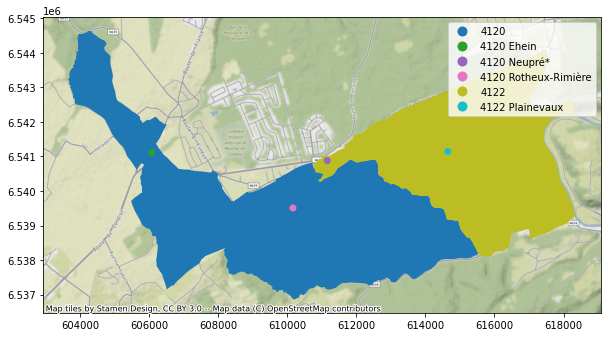

,zipcode,geometry,label
411,4120,"POLYGON Z ((604356.408 6544578.503 0.000, 6043...",4120
413,4122,"POLYGON Z ((617503.511 6544062.555 0.000, 6175...",4122
701,4120,POINT (611156.016 6540881.061),4120 Neupré*
702,4120,POINT (610162.122 6539508.443),4120 Rotheux-Rimière
1290,4122,POINT (614650.691 6541144.169),4122 Plainevaux
2364,4120,POINT (606071.687 6541115.511),4120 Ehein


--------------
Mismatch record 25:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
25,4910,False,"POLYGON Z ((654464.107 6535116.816 0.000, 6544...",2423,Polleur,4800


From BPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
632,4800,Ensival,Oui,VERVIERS,LIEGE,False
1264,4910,La Reid,Oui,THEUX,LIEGE,False
1275,4800,Lambermont,Oui,VERVIERS,LIEGE,False
1904,4800,Petit-Rechain,Oui,VERVIERS,LIEGE,False
1926,4800,Polleur,Oui,VERVIERS,LIEGE,False
1927,4910,Polleur,Oui,THEUX,LIEGE,False
2345,4910,Theux,Non,THEUX,LIEGE,False
2457,4800,Verviers,Non,VERVIERS,LIEGE,False


Know by OSM at the given point:
Thier de Polleur, Polleur, Theux, Verviers, Liège, Wallonie, 4910, België / Belgique / Belgien
Know by OSM for the given locality:
Polleur, Theux, Verviers, Liège, Wallonie, 4910, België / Belgique / Belgien


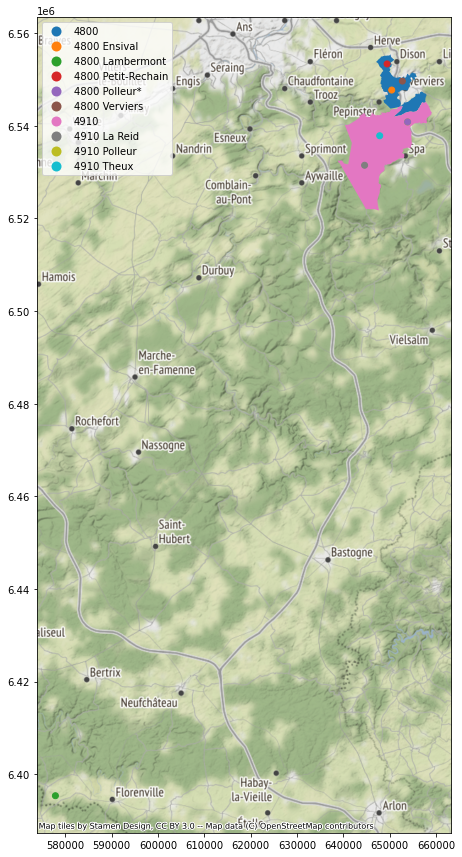

,zipcode,geometry,label
523,4800,MULTIPOLYGON Z (((656867.329 6547416.177 0.000...,4800
545,4910,"POLYGON Z ((654464.107 6535116.816 0.000, 6544...",4910
209,4800,POINT (652761.286 6549653.344),4800 Verviers
215,4910,POINT (644602.903 6531477.055),4910 La Reid
774,4800,POINT (577859.588 6395375.603),4800 Lambermont
1349,4910,POINT (653882.825 6540834.098),4910 Polleur
1904,4910,POINT (647867.813 6537848.675),4910 Theux
2421,4800,POINT (650460.045 6547714.947),4800 Ensival
2422,4800,POINT (649457.769 6553350.139),4800 Petit-Rechain
2423,4800,POINT (653882.825 6540834.098),4800 Polleur*


--------------
Mismatch record 30:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
30,5541,False,"POLYGON Z ((538168.187 6483865.512 0.000, 5382...",835,Hastière,5540


From BPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
961,5540,Hastière-Lavaux,Oui,HASTIÈRE,NAMUR,False
962,5541,Hastière-Par-Delà,Oui,HASTIÈRE,NAMUR,False
1020,5540,Hermeton-Sur-Meuse,Oui,HASTIÈRE,NAMUR,False
2615,5540,Waulsort,Oui,HASTIÈRE,NAMUR,False


Know by OSM at the given point:
Hermeton-sur-Meuse, Hastière, Dinant, Namur, Wallonie, 5540, België / Belgique / Belgien
Know by OSM for the given locality:
Hastière, Dinant, Namur, Wallonie, België / Belgique / Belgien


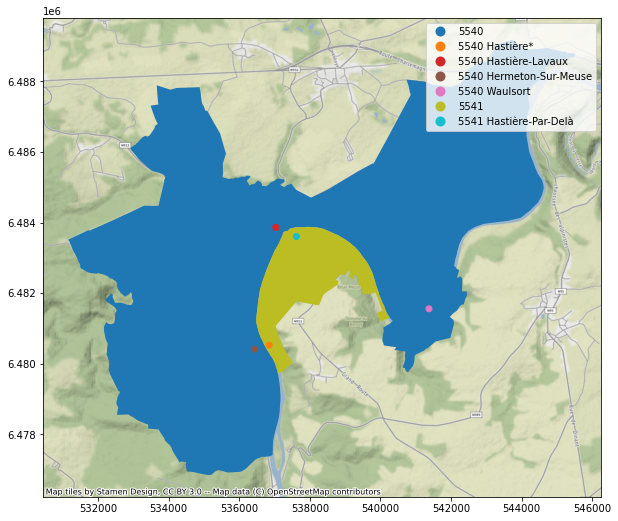

,zipcode,geometry,label
614,5540,"POLYGON Z ((543741.262 6489179.756 0.000, 5440...",5540
615,5541,"POLYGON Z ((538168.187 6483865.512 0.000, 5382...",5541
254,5540,POINT (536439.598 6480412.186),5540 Hermeton-Sur-Meuse
255,5541,POINT (537615.856 6483606.989),5541 Hastière-Par-Delà
835,5540,POINT (536844.276 6480524.871),5540 Hastière*
836,5540,POINT (541373.979 6481556.563),5540 Waulsort
1396,5540,POINT (537032.196 6483861.725),5540 Hastière-Lavaux


--------------
Mismatch record 43:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
43,8952,False,"POLYGON Z ((317308.967 6581658.756 0.000, 3172...",2694,Heuvelland,8950


From BPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1714,8950,Nieuwkerke,Oui,HEUVELLAND,FLANDRE-OCCIDENTALE,False
2707,8952,Wulvergem,Oui,HEUVELLAND,FLANDRE-OCCIDENTALE,False


Know by OSM at the given point:
11, Vrooilandstraat, Wulvergem, Heuvelland, Ieper, West-Vlaanderen, Vlaanderen, 8952, België / Belgique / Belgien
Know by OSM for the given locality:
Heuvelland, Ieper, West-Vlaanderen, Vlaanderen, België / Belgique / Belgien


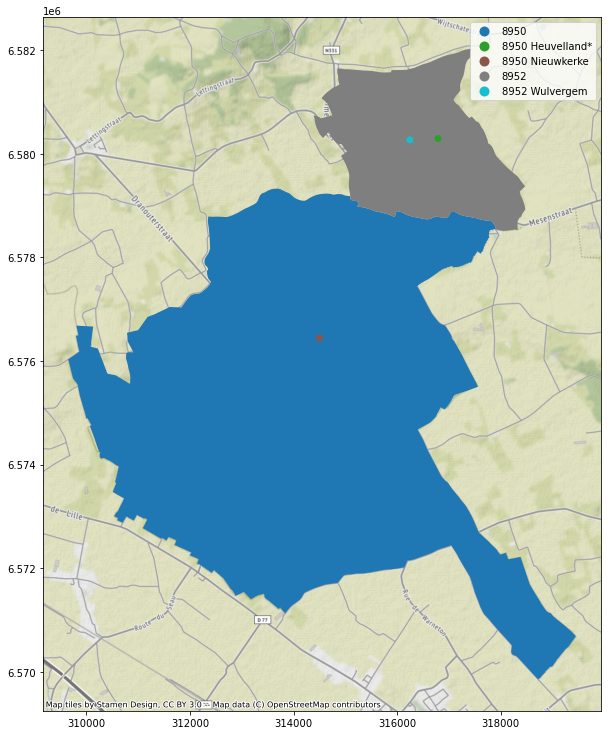

,zipcode,geometry,label
1059,8950,"POLYGON Z ((314156.302 6579096.091 0.000, 3142...",8950
1061,8952,"POLYGON Z ((317308.967 6581658.756 0.000, 3172...",8952
484,8952,POINT (316244.117 6580270.370),8952 Wulvergem
1071,8950,POINT (314499.068 6576440.484),8950 Nieuwkerke
2694,8950,POINT (316786.986 6580295.900),8950 Heuvelland*


--------------


In [28]:
# for i in range(sjoin_mismatches.shape[0]):
for i in [8, 19, 25, 30, 43]:
    plot_mismatch_zip(sjoin_mismatches, i)
    print("--------------")

In [29]:
# We see that most centers of Antwerpen localities are located at the same point. Is that the case for other points?
# Note: using duplicate on geometry takes ages... so we convert first geometry in string
zipcodes_centers_str = zipcodes_centers.assign(geo_str=zipcodes_centers.geometry.astype(str))
zipcodes_centers_str[zipcodes_centers_str.geo_str.duplicated(keep=False)].sort_values("geo_str").set_index(["geo_str", "zipcode"])

locality  \
geo_str                                     zipcode                          
POINT (372533.6220434097 6572912.43522917)  8587         Espierres-Helchin   
                                            8587                 Espierres   
POINT (395069.5777684004 6573364.955567489) 7910                Wattripont   
                                            7910            Arc-Wattripont   
POINT (395340.084131028 6598538.723633)     9790                     Ooike   
                                            9700                     Ooike   
POINT (422998.1279595401 6590418.752107166) 9660      Sint-Maria-Oudenhove   
                                            9620      Sint-Maria-Oudenhove   
POINT (427257.397024243 6603418.736012119)  9520                 Oombergen   
                                            9620                 Oombergen   
POINT (439115.7169129455 6652178.118199107) 9500                  Moerbeke   
                                            9180             Moerbeke-Waas   
POINT (458667.5584662316 6636903.365626968) 9220                     Hamme   
                                            1785                     Hamme   
POINT (489773.2653310411 6660499.058549562) 2000                 Antwerpen   
                                            2040                 Antwerpen   
                                            2030                 Antwerpen   
                                            2060                 Antwerpen   
                                            2020                 Antwerpen   
                                            2018                 Antwerpen   
                                            2050                 Antwerpen   
POINT (491205.1426938545 6602205.979242534) 1130                     Haren   
                                            3700                     Haren   
POINT (552409.672631124 6592096.550338984)  3300     Sint-Margriete-Houtem   
                                            3470     Sint-Margriete-Houtem   
POINT (573531.0632112664 6651342.954422484) 3700                      Berg   
                                            1910                      Berg   
POINT (594620.2265427893 6641953.106363286) 3940                   Hechtel   
                                            3940             Hechtel-Eksel   
POINT (603427.0590545551 6586474.891009753) 3840                   Kolmont   
                                            3700                   Kolmont   
POINT (606071.6873292801 6541115.510501331) 4120                     Ehein   
                                            4480                     Ehein   
POINT (620430.3097728941 6558761.193795813) 4000                     Liège   
                                            4020                     Liège   
POINT (636441.1137904357 6537670.235794714) 4920                 Louveigné   
                                            4141                 Louveigné   
POINT (644646.0282233725 6539302.165353199) 6661                      Mont   
                                            5530                      Mont   
POINT (653882.8247542619 6540834.097829796) 4910                   Polleur   
                                            4800                   Polleur   

                                                                           geometry  
geo_str                                     zipcode                                  
POINT (372533.6220434097 6572912.43522917)  8587     POINT (372533.622 6572912.435)  
                                            8587     POINT (372533.622 6572912.435)  
POINT (395069.5777684004 6573364.955567489) 7910     POINT (395069.578 6573364.956)  
                                            7910     POINT (395069.578 6573364.956)  
POINT (395340.084131028 6598538.723633)     9790     POINT (395340.084 6598538.724)  
                                            9700     POINT (395340.084 6598538.724)  
POINT (422998.127959540

# Spatial join: polygon vs polygon

As as second example, we join polygons (main communes from postal data, merging zipcode boundaries) to polygons (from nis code boundaries). This will allow us: 

- Detect mismatch between the sources
- Map a commune (name) from postal data to its corresponding name in NIS data
- As a side effect, map a zip code to its (enclosing) nis code

The main difficulty resides in the fact that the two sources do not have the same level of precision, which makes that often, 
a zone from one source have a very small overlap to is neighbor zone in the other source. 

First step: group zipcodes boundaries by main commune. We need to exclude "special code"

In [30]:
# Remove all special codes (note: special codes from  zipcodes_boundaries and zipcodes are note fully coherent. 
# Data from zipcodes seems to be more reliable)
zipcodes_boundaries_normal = zipcodes_boundaries[zipcodes_boundaries.zipcode.isin(zipcodes_normal.zipcode)]
zipcodes_boundaries_normal

,zipcode,is_special,geometry
0,1000,False,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...
8,1020,False,"POLYGON Z ((484519.836 6603848.988 0.000, 4845..."
9,1030,False,"POLYGON Z ((488633.964 6600056.547 0.000, 4887..."
13,1040,False,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...
21,1050,False,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...
...,...,...,...
1182,9982,False,"POLYGON Z ((398126.149 6670079.581 0.000, 3981..."
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021..."
1184,9990,False,"POLYGON Z ((383123.261 6664423.574 0.000, 3831..."
1185,9991,False,"POLYGON Z ((389466.378 6660430.021 0.000, 3895..."


Then we merge zipcodes boundaries by main commune

In [31]:
main_commune_boundaries = zipcodes_boundaries_normal.merge(zipcodes[["zipcode","main_commune"]].drop_duplicates())[["main_commune", "geometry"]].dissolve("main_commune").reset_index()

And fill the holes left by special code

In [32]:
# From https://stackoverflow.com/a/61466689/4640490
def close_holes(poly: shapely.geometry.Polygon) -> shapely.geometry.Polygon:
        """
        Close polygon holes by limitation to the exterior ring.
        Args:
            poly: Input shapely Polygon
        Example:
            df.geometry.apply(lambda p: close_holes(p))
        """
        if isinstance(poly, shapely.geometry.Polygon) and poly.interiors:
            return shapely.geometry.Polygon(list(poly.exterior.coords))
        else:
            return poly

main_commune_boundaries.geometry = main_commune_boundaries.geometry.apply(lambda p: close_holes(p))

In [33]:
# Consistency check : do we have the same number of main communes in the two dataset?
print("Number of main communes:", main_commune_boundaries.shape[0])
print("Number of nis codes    :", nis_boundaries.shape[0])

Number of main communes: 581
Number of nis codes    : 581


In [34]:
sjoin_zip_nis_bnd = gpd.sjoin(main_commune_boundaries[["main_commune", "geometry"]], 
          nis_boundaries[["niscode",  "T_MUN_FR", "T_MUN_NL", "geometry"]])

sjoin_zip_nis_bnd = sjoin_zip_nis_bnd.merge(nis_boundaries[["geometry"]].rename({"geometry": "geometry_nis"}, axis=1), left_on="index_right", right_index=True )
sjoin_zip_nis_bnd

,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis
0,AALST,"POLYGON Z ((444815.290 6610373.362 0.000, 4449...",247,41024,Haaltert,Haaltert,"POLYGON Z ((444954.143 6596751.042 0.000, 4449..."
123,DENDERLEEUW,"POLYGON Z ((452230.458 6598608.491 0.000, 4521...",247,41024,Haaltert,Haaltert,"POLYGON Z ((444954.143 6596751.042 0.000, 4449..."
149,ERPE-MERE,"POLYGON Z ((443724.293 6606512.588 0.000, 4436...",247,41024,Haaltert,Haaltert,"POLYGON Z ((444954.143 6596751.042 0.000, 4449..."
205,HAALTERT,"POLYGON Z ((443723.645 6606499.476 0.000, 4437...",247,41024,Haaltert,Haaltert,"POLYGON Z ((444954.143 6596751.042 0.000, 4449..."
235,HERZELE,"POLYGON Z ((435961.441 6600303.285 0.000, 4360...",247,41024,Haaltert,Haaltert,"POLYGON Z ((444954.143 6596751.042 0.000, 4449..."
...,...,...,...,...,...,...,...
526,VIRTON,"POLYGON Z ((612667.628 6372176.415 0.000, 6127...",542,85047,Rouvroy,Rouvroy,"POLYGON Z ((614367.944 6362984.609 0.000, 6143..."
370,MOERBEKE-WAAS,"POLYGON Z ((442800.468 6661195.878 0.000, 4428...",302,46024,Stekene,Stekene,"POLYGON Z ((446225.697 6652626.710 0.000, 4462..."
473,SINT-GILLIS-WAAS,"POLYGON Z ((463162.161 6657229.671 0.000, 4631...",302,46024,Stekene,Stekene,"POLYGON Z ((446225.697 6652626.710 0.000, 4462..."
478,SINT-NIKLAAS,"POLYGON Z ((454823.432 6652387.635 0.000, 4548...",302,46024,Stekene,Stekene,"POLYGON Z ((446225.697 6652626.710 0.000, 4462..."


In [35]:
def get_intersection_area(rec):
    try : 
        return rec.geometry.intersection(rec.geometry_nis).area
    except shapely.errors.TopologicalError :
        return rec.geometry.intersection(rec.geometry_nis.buffer(0.01)).area
        #return None

In [36]:
sjoin_zip_nis_bnd["intersect_area"] = sjoin_zip_nis_bnd.apply(get_intersection_area, axis=1)

If the intersection between the two zones is "low", we consider that this is due to two "touching" zones, while if the intersection is "high", we have two realy overlapping zones.

So what it "low" ?

We first consider the (logarithmic) distribution of the intersection area (in square meters). There are clearly two separete regions, but finding a threshold might not that easy

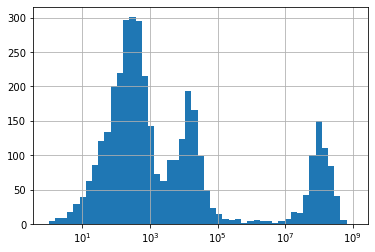

In [37]:
sjoin_zip_nis_bnd.intersect_area.hist(bins=10**np.linspace(0, 9))
plt.xscale('log')

If, instead of considering the intersection are, we consider the intersection ratio, the two regions are much better separated. 

In [38]:
sjoin_zip_nis_bnd["intersect_area_ratio_zip"] = sjoin_zip_nis_bnd["intersect_area"]/sjoin_zip_nis_bnd.area
sjoin_zip_nis_bnd["intersect_area_ratio_nis"] = sjoin_zip_nis_bnd["intersect_area"]/sjoin_zip_nis_bnd.geometry_nis.area

Text(0.5, 1.0, 'Intersection ratio vs Zip')

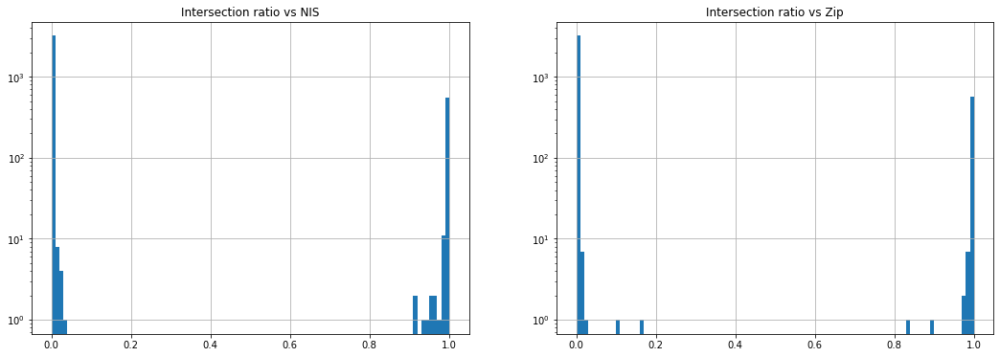

In [39]:
f,ax = plt.subplots(1,2,figsize=(18, 6))
sjoin_zip_nis_bnd.intersect_area_ratio_nis.hist(bins=100, log=True, ax=ax[0]) ; ax[0].set_title("Intersection ratio vs NIS")
sjoin_zip_nis_bnd.intersect_area_ratio_zip.hist(bins=100, log=True, ax=ax[1]) ; ax[1].set_title("Intersection ratio vs Zip")

But we have still a few values to further investigated.

We have to map every commune (from zipcode data) to one (and only one) nis, and vice-versa. 

If we take a too low threshold, we migth map a commune (from zipcode) to more than one nis

If we take a too high threshold, we might not map commune to any nis.

From the graph bellow, we see that for a threshold between 0.2 and 0.8, every single zip commune is mapped to a single nis.

  0%|          | 0/97 [00:00<?, ?it/s]

<AxesSubplot:xlabel='thresh'>

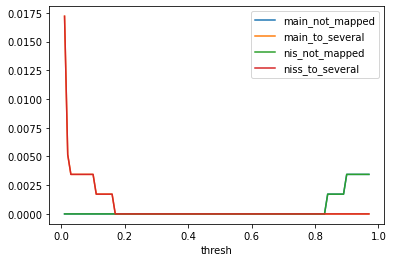

In [40]:
area_thresholds=[]
from tqdm.auto import tqdm
for th in tqdm(range(1, 98, 1)):

    query = f"intersect_area_ratio_zip>{th/100.0}"
    
    main_to_one_nis = sjoin_zip_nis_bnd.query(query).groupby("main_commune").niscode.count().value_counts().loc[1]/sjoin_zip_nis_bnd.main_commune.nunique()
    nis_to_one_main = sjoin_zip_nis_bnd.query(query).groupby("niscode").main_commune.count().value_counts().loc[1]/sjoin_zip_nis_bnd.niscode.nunique()
    
    main_not_mapped = (sjoin_zip_nis_bnd.main_commune.nunique() - sjoin_zip_nis_bnd.query(query).main_commune.nunique() ) / sjoin_zip_nis_bnd.main_commune.nunique()
    main_to_several = sjoin_zip_nis_bnd.query(query).main_commune.duplicated().sum() /  sjoin_zip_nis_bnd.main_commune.nunique()

    nis_not_mapped = (sjoin_zip_nis_bnd.niscode.nunique() - sjoin_zip_nis_bnd.query(query).niscode.nunique() ) / sjoin_zip_nis_bnd.niscode.nunique()
    nis_to_several = sjoin_zip_nis_bnd.query(query).niscode.duplicated().sum() /  sjoin_zip_nis_bnd.niscode.nunique()

    area_thresholds.append({"thresh":th/100, 
                           #"main_to_one_nis": main_to_one_nis,
                           #"nis_to_one_main": nis_to_one_main,
                           "main_not_mapped": main_not_mapped,
                           "main_to_several": main_to_several,
                           "nis_not_mapped":  nis_not_mapped,
                           "niss_to_several": nis_to_several,
                           
                           })
    
area_thresholds = pd.DataFrame(area_thresholds).set_index("thresh")  
area_thresholds.plot()
# area_thresholds

## Detect ambiguities

We will here plot the "ambiguities", i.e., zip commune with a "rather high" overlap to more that one nis commune

In [41]:
sjoin_ambiguities = sjoin_zip_nis_bnd[sjoin_zip_nis_bnd.intersect_area_ratio_zip.between(0.02, 0.98) |
                                      sjoin_zip_nis_bnd.intersect_area_ratio_nis.between(0.02, 0.98)].reset_index(drop=True)
sjoin_ambiguities

,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
0,BRUXELLES,MULTIPOLYGON Z (((488053.262 6588268.829 0.000...,72,21004,Bruxelles,Brussel,"POLYGON Z ((489511.425 6586199.186 0.000, 4895...",7.770481e+07,0.999958,0.936709
1,ETTERBEEK,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,72,21004,Bruxelles,Brussel,"POLYGON Z ((489511.425 6586199.186 0.000, 4895...",1.518269e+06,0.160291,0.018302
2,IXELLES,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,72,21004,Bruxelles,Brussel,"POLYGON Z ((489511.425 6586199.186 0.000, 4895...",1.841104e+06,0.103683,0.022194
3,DROGENBOS,"POLYGON Z ((478880.939 6588291.060 0.000, 4791...",115,23098,Drogenbos,Drogenbos,"POLYGON Z ((480801.458 6582450.394 0.000, 4802...",5.995117e+06,0.999929,0.961099
4,SINT-PIETERS-LEEUW,"POLYGON Z ((478752.588 6588151.699 0.000, 4787...",115,23098,Drogenbos,Drogenbos,"POLYGON Z ((480801.458 6582450.394 0.000, 4802...",2.425125e+05,0.002381,0.038878
5,IXELLES,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,77,21009,Ixelles,Elsene,MULTIPOLYGON Z (((489029.873 6586179.784 0.000...,1.588645e+07,0.894660,0.990829
6,ETTERBEEK,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,73,21005,Etterbeek,Etterbeek,"POLYGON Z ((488713.352 6590019.224 0.000, 4886...",7.947716e+06,0.839078,0.999655
7,BAARLE-HERTOG,MULTIPOLYGON Z (((549450.124 6694015.813 0.000...,43,13002,Baerle-Duc,Baarle-Hertog,MULTIPOLYGON Z (((548571.433 6691545.510 0.000...,1.793763e+07,0.999196,0.942514
8,HOOGSTRATEN,"POLYGON Z ((530883.120 6690348.947 0.000, 5308...",43,13002,Baerle-Duc,Baarle-Hertog,MULTIPOLYGON Z (((548571.433 6691545.510 0.000...,4.742114e+05,0.001748,0.024917
9,MERKSPLAS,"POLYGON Z ((539878.978 6694908.114 0.000, 5398...",43,13002,Baerle-Duc,Baarle-Hertog,MULTIPOLYGON Z (((548571.433 6691545.510 0.000...,3.835542e+05,0.003345,0.020153


In [42]:
def plot_mismatch_boundaries(mismatch_record, nis_boundaries, main_commune_boundaries):

    r_nis=nis_boundaries[nis_boundaries.niscode == mismatch_record.niscode].assign(kind="nis")
    r_zip=main_commune_boundaries[main_commune_boundaries.main_commune == mismatch_record.main_commune].assign(kind="zip")
    
    common = gpd.overlay(r_nis, r_zip, how="intersection")
    common["label"]= "Common"
    
    
    only_nis = gpd.overlay(r_nis, r_zip, how="difference")
    only_nis["label"] = "Only NIS ("+r_nis.T_MUN_FR+")"
    
    only_zip = gpd.overlay(r_zip, r_nis, how="difference")
    only_zip["label"] = "Only ZIP ("+r_zip.main_commune+")"
    
    
    polygons= pd.concat([only_nis, only_zip, common])[["label", "geometry", "kind"]]
        
        
    polygons=polygons.to_crs(osm_crs)

    if with_plotly:
        fig = px.choropleth_mapbox(polygons, 
                           geojson=polygons.geometry, 
                           locations=polygons.index, 
                           hover_name="label",
                           color=polygons['label'],
                           center={"lat": polygons.bounds.mean()[["miny", "maxy"]].mean(), 
                                   "lon": polygons.bounds.mean()[["minx", "maxx"]].mean()},
                           mapbox_style="open-street-map",
                           opacity=0.5,
         )

        fig.show()
        
    else: 
        ax = polygons.to_crs(crs).plot("label", legend=True, alpha=0.5, figsize=(15,15), cmap='prism')
        try:
            ctx.add_basemap(ax)
        except Exception as  e:
            print("Cannot add basemap: ", e)
        plt.show()
    return polygons

,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
1,ETTERBEEK,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,72,21004,Bruxelles,Brussel,"POLYGON Z ((489511.425 6586199.186 0.000, 4895...",1.518269e+06,0.160291,0.018302


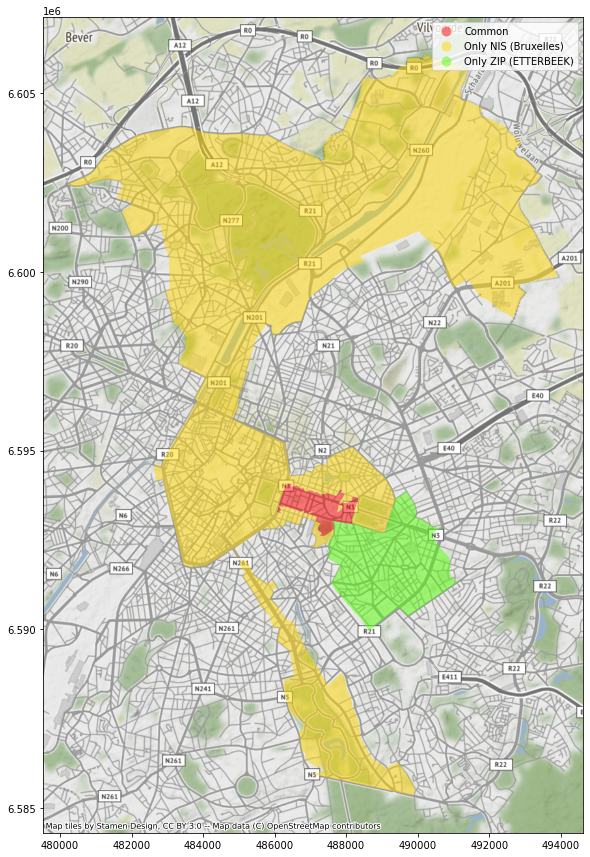

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
2,IXELLES,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,72,21004,Bruxelles,Brussel,"POLYGON Z ((489511.425 6586199.186 0.000, 4895...",1.841104e+06,0.103683,0.022194


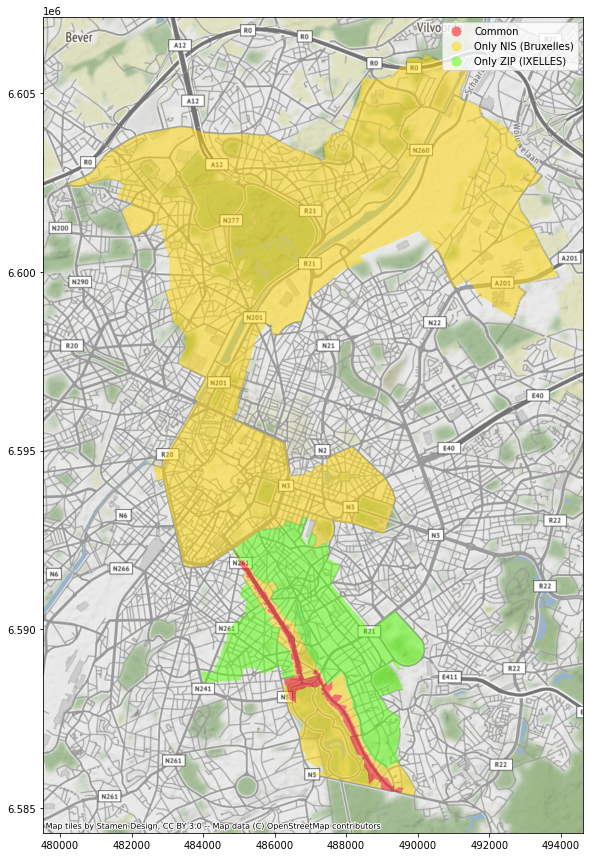

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
4,SINT-PIETERS-LEEUW,"POLYGON Z ((478752.588 6588151.699 0.000, 4787...",115,23098,Drogenbos,Drogenbos,"POLYGON Z ((480801.458 6582450.394 0.000, 4802...",242512.517779,0.002381,0.038878


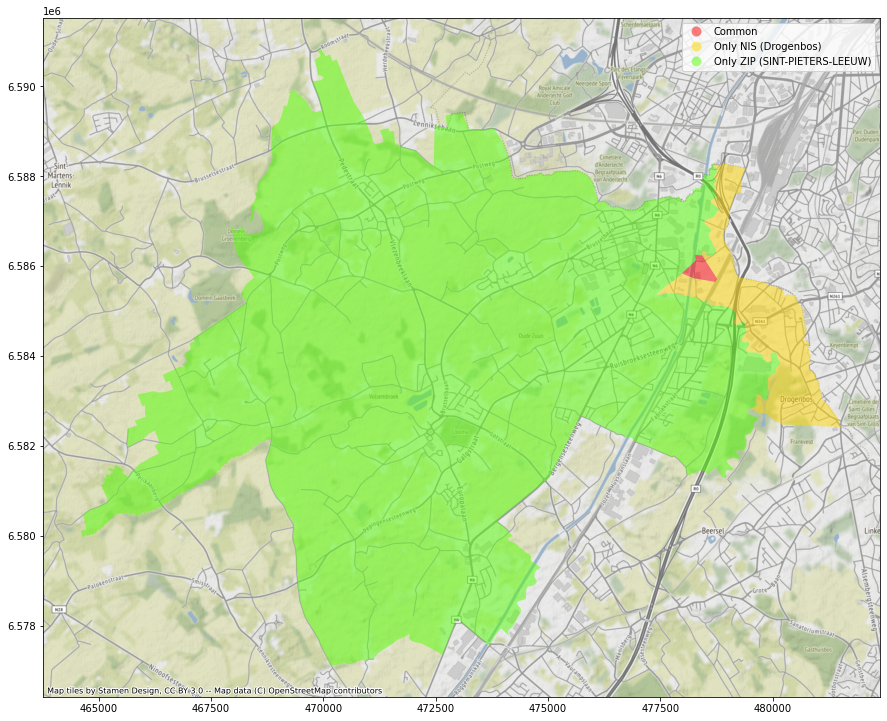

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
8,HOOGSTRATEN,"POLYGON Z ((530883.120 6690348.947 0.000, 5308...",43,13002,Baerle-Duc,Baarle-Hertog,MULTIPOLYGON Z (((548571.433 6691545.510 0.000...,474211.385984,0.001748,0.024917


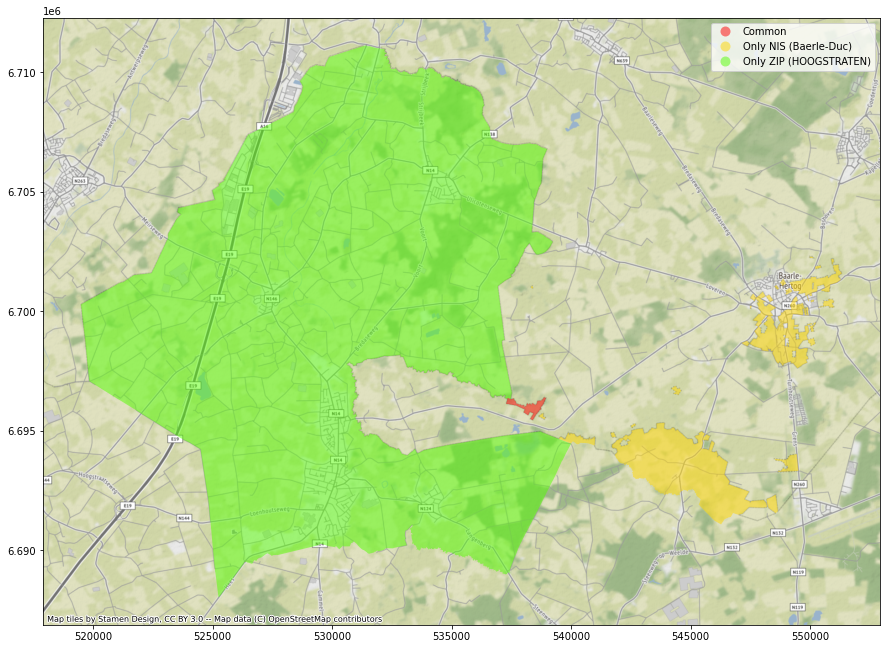

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
14,HAM-SUR-HEURE,"POLYGON Z ((493020.407 6509850.882 0.000, 4929...",355,56086,Ham-sur-Heure-Nalinnes,Ham-sur-Heure-Nalinnes,"POLYGON Z ((488808.963 6497099.262 0.000, 4888...",1.098956e+08,0.97159,0.98102


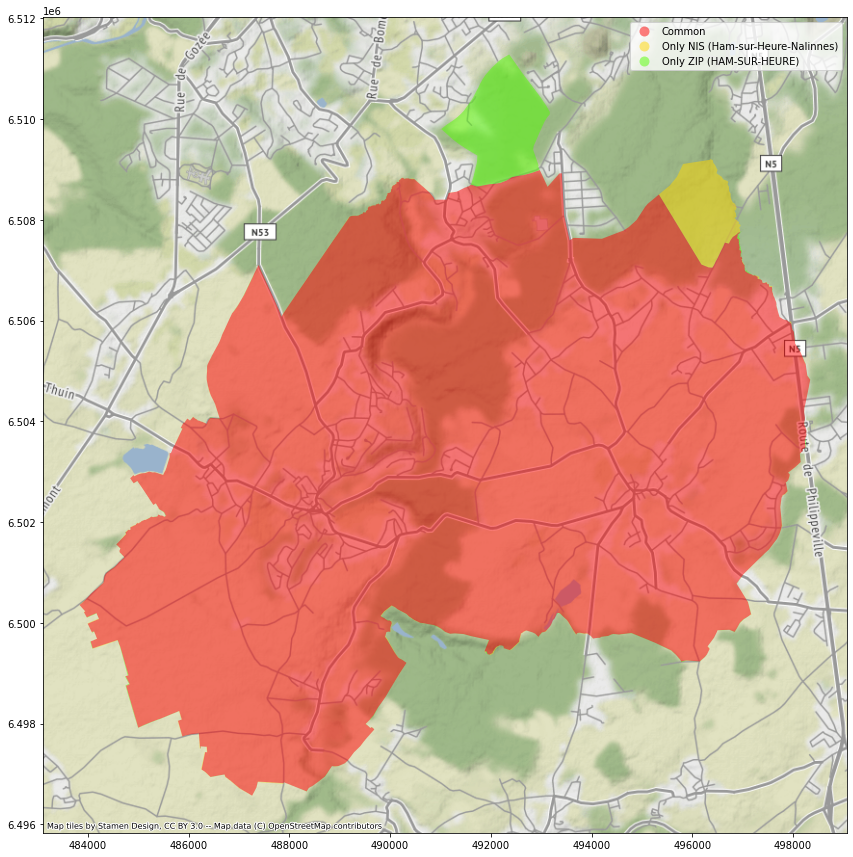

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
17,OTTIGNIES-LOUVAIN-LA-NEUVE,"POLYGON Z ((513291.512 6561137.196 0.000, 5132...",164,25068,Mont-Saint-Guibert,Mont-Saint-Guibert,"POLYGON Z ((515737.452 6556309.608 0.000, 5157...",1.108463e+06,0.013265,0.02384


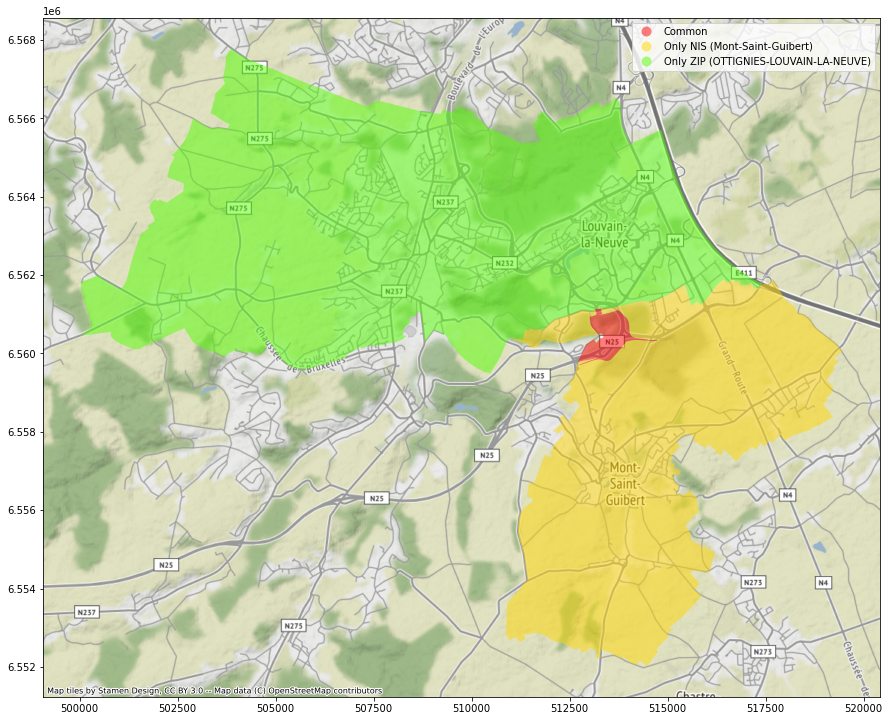

------


,main_commune,geometry,index_right,niscode,T_MUN_FR,T_MUN_NL,geometry_nis,intersect_area,intersect_area_ratio_zip,intersect_area_ratio_nis
19,RAEREN,"POLYGON Z ((683436.351 6566996.135 0.000, 6836...",430,63061,Raeren,Raeren,"POLYGON Z ((694073.281 6555433.340 0.000, 6941...",1.808707e+08,0.974129,0.999191


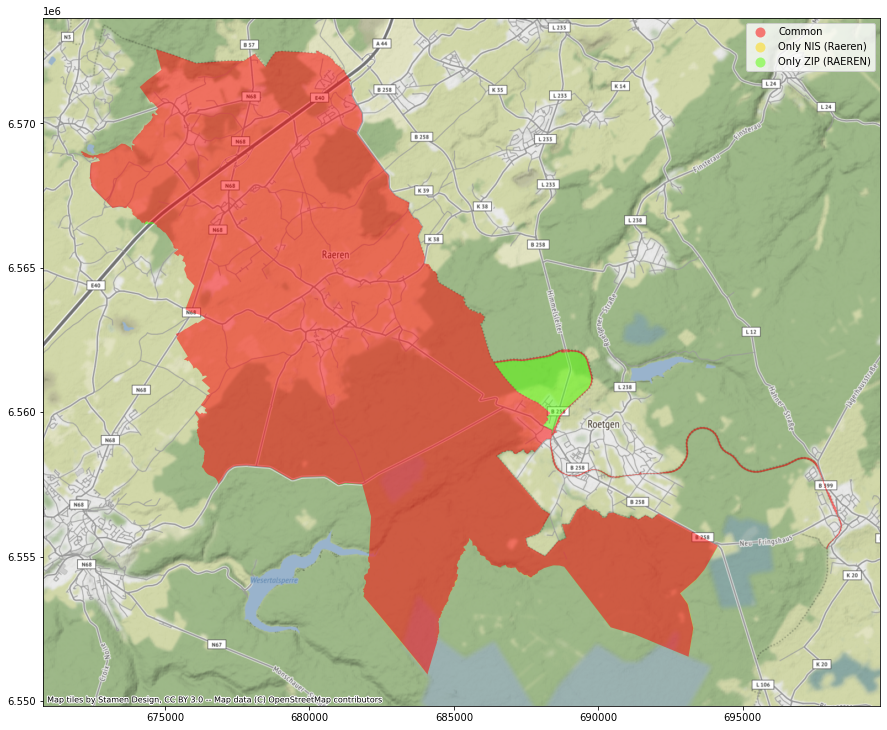

------


In [43]:
#for k, mismatch_rec in sjoin_ambiguities[sjoin_ambiguities.main_commune == sjoin_ambiguities.T_MUN_FR.str.upper()].iterrows():
for k in [1, 2, 4, 8, 14, 17, 19]:    
    display(sjoin_ambiguities.loc[[k]])

    plot_mismatch_boundaries(sjoin_ambiguities.loc[k], nis_boundaries, main_commune_boundaries)
    print("------")

In [44]:
# Allows to generate more specific image
# polygons = plot_mismatch_boundaries(sjoin_ambiguities.loc[19], nis_boundaries, main_commune_boundaries)

# minx, miny, maxx, maxy = polygons.to_crs(crs).total_bounds
# width  = maxx - minx 
# height = maxy - miny
# ax = polygons.to_crs(crs).plot("label", legend=True, alpha=0.5, figsize=(12,8), cmap='prism')
# 1: Etterbeek
#ax.set_xlim(minx+width/3.6, maxx-width/3.6)
#ax.set_ylim(miny+height/3, maxy-height/2)
# 2 : Ixelles
# ax.set_xlim(minx+width/4, maxx-width/4)
# ax.set_ylim(miny, maxy-height/1.6)
# 4 : Drogenbos
# ax.set_xlim(minx+width/1.7, maxx)
# ax.set_ylim(miny+height/2.5, maxy-height/5)
# 8 : Baerle-Duc
# ax.set_xlim(minx+width/3, maxx-width/4)
# ax.set_ylim(miny+height/5, maxy-height/3.5)
# 14: Ham-Sur-Heure
# ax.set_xlim(minx+width/5,   maxx-width/5)
# ax.set_ylim(miny+height/4.5, maxy-height/2.5)
# 17: Ham-Sur-Heure
# ax.set_xlim(minx+width/3,   maxx-width/6)
# ax.set_ylim(miny+height/5, maxy-height/5)
# 19: Raeren
# ax.set_xlim(minx+width/3,   maxx-width/6)
# ax.set_ylim(miny+height/5, maxy-height/5)

# ctx.add_basemap(ax)


## Map zipcode to niscode

In [45]:
sjoin_safe = sjoin_zip_nis_bnd[sjoin_zip_nis_bnd.intersect_area_ratio_zip >= 0.5]

In [46]:
sjoin_safe.shape[0], sjoin_safe.main_commune.nunique(), sjoin_safe.niscode.nunique()

(581, 581, 581)

In [47]:
zipcodes[["zipcode", "locality", "main_commune"]].merge(sjoin_safe[["main_commune", "niscode"]]).sort_values("zipcode")

,zipcode,locality,main_commune,niscode
1560,1000,Bruxelles,BRUXELLES,21004
1562,1020,Laeken,BRUXELLES,21004
2682,1030,Schaerbeek,SCHAERBEEK,21015
2065,1040,Etterbeek,ETTERBEEK,21005
2456,1050,Ixelles,IXELLES,21009
...,...,...,...,...
2692,9988,Watervliet,SINT-LAUREINS,43014
2691,9988,Waterland-Oudeman,SINT-LAUREINS,43014
134,9990,Maldegem,MALDEGEM,43010
133,9991,Adegem,MALDEGEM,43010


## Subcommunes divisions

In [48]:
nis6_per_nis =   statistical_sectors.groupby("CNIS5_2020").C_NIS6.nunique().reset_index().rename({"CNIS5_2020":"niscode",
                                                                                                  "C_NIS6": "nb_nis6"}, axis=1)
locality_per_commune=  zipcodes[~zipcodes.is_special].groupby("main_commune").locality.count().reset_index().rename({"locality": "nb_locality"}, axis=1)

In [49]:
locality_counts = sjoin_safe[["main_commune", "niscode"]].merge(locality_per_commune).merge(nis6_per_nis)
locality_counts 

,main_commune,niscode,nb_locality,nb_nis6
0,HAALTERT,41024,4,5
1,DENDERLEEUW,41011,3,3
2,AFFLIGEM,23105,4,3
3,ASSE,23002,6,6
4,ERPE-MERE,41082,8,8
...,...,...,...,...
576,LIERNEUX,63045,3,4
577,TROIS-PONTS,63086,4,3
578,MOERBEKE-WAAS,44045,1,1
579,ROUVROY,85047,4,4


In [50]:
# Number of localities is not equal to number of NIS6 sectors
locality_counts[locality_counts.nb_locality != locality_counts.nb_nis6].assign(diff = locality_counts.nb_locality - locality_counts.nb_nis6).sort_values("diff")

,main_commune,niscode,nb_locality,nb_nis6,diff
390,OOSTENDE,35013,3,7,-4
31,ANTWERPEN,11002,17,20,-3
168,ATH,51004,19,22,-3
74,BRUXELLES,21004,4,7,-3
319,LA LOUVIÈRE,58001,10,12,-2
...,...,...,...,...,...
425,GEMBLOUX,92142,12,8,4
321,BIÈVRE,91015,10,5,5
320,VRESSE-SUR-SEMOIS,91143,12,7,5
559,OUDENAARDE,45035,14,6,8
